In [1]:
import fitsio
import numpy as np
import k3d
import pandas as pd
import SEdist
import pygwalker as pyg
import matplotlib.pyplot as plt
import scienceplots
import scipy.spatial
import itertools
from scipy.interpolate import interp1d
import healpy
plt.style.use(['science'])
color_list = plt.rcParams["axes.prop_cycle"].by_key()["color"]

from astropy.coordinates import SkyCoord
from astropy.cosmology import Planck15 as default_cosmo
import astropy.units as u
import astropy.cosmology.units as cu

import utils

In [2]:
# Read FITS data from the specified directory
d205 = fitsio.read('../../data/quaia/quaia_G20.5.fits')
r205 = fitsio.read('../../data/quaia/random_G20.5_10x.fits')

df  = pd.DataFrame(d205.byteswap().newbyteorder())
rof = pd.DataFrame(r205.byteswap().newbyteorder())

# Add cartesian coordinates DataFrame
df = utils.add_cartesian_coordinates(df)

# randoms do not have redshifts. Let's create them from the redshift distribution of the data. 
sez =  SEdist.SE_distribution(df["redshift_quaia"]) # create empirical empirical distribution function
rf = rof.sample(n=df.shape[0], replace=False) # catalog of randoms same length as data
newlz = sez.rvs(size=len(rof['ra']))          # samples new random variates from it
rof = utils.add_cartesian_coordinates(rof, redshifts=newlz)  # add redshifts to randoms
# smaller randoms:
newz = np.random.choice(df['redshift_quaia'], size=rf.shape[0], replace=False) # subsample redshifts from data
rf = utils.add_cartesian_coordinates(rf, redshifts=newz)  # add redshifts to downsampled randoms

Text(0, 0.5, 'CDF(z)')

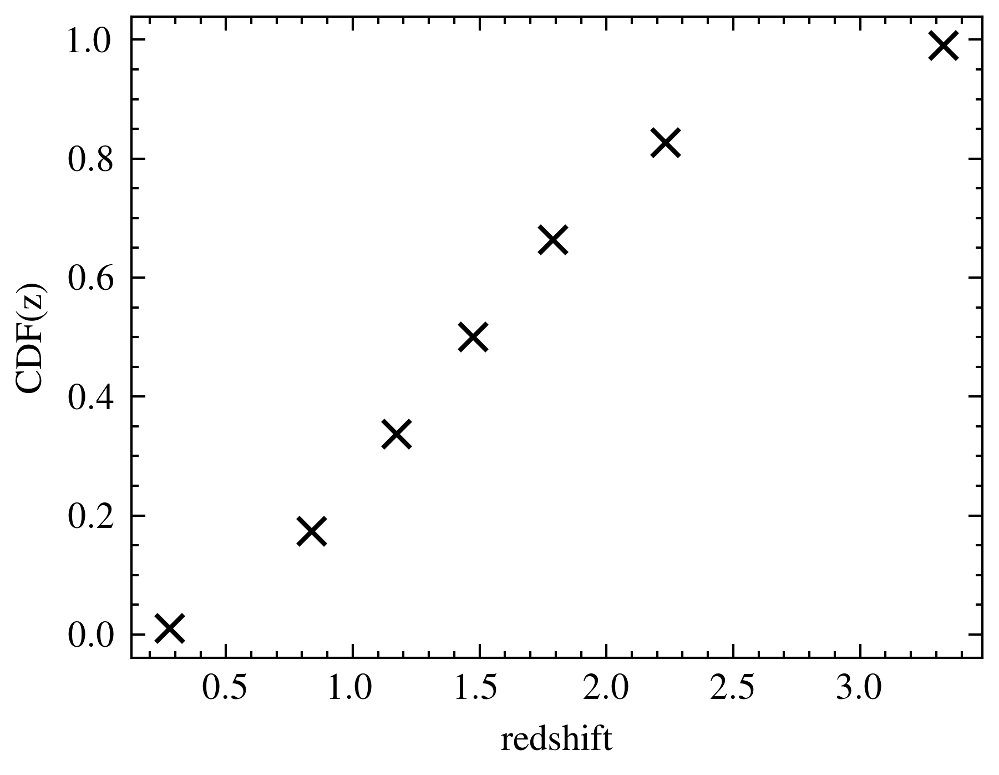

In [3]:
Nzs = 7 # number of redshift bins containing the same number of objects in each bin
pcc = 0.01
pcts = np.linspace(pcc, 1-pcc, Nzs)
zs = sez.ppf(pcts)
plt.plot(zs,sez.cdf(zs),'x');
plt.xlabel('redshift')
plt.ylabel('CDF(z)')

In [4]:
zs

array([0.27964157, 0.83743519, 1.17230317, 1.47379243, 1.790272  ,
       2.23374422, 3.32987146])

In [5]:
#pyg.walk(df)

In [6]:
ddt = scipy.spatial.cKDTree(np.vstack([df['x'],df['y'],df['z']]).T) # tree of data
rt = scipy.spatial.cKDTree(np.vstack([rf['x'],rf['y'],rf['z']]).T) # tree of randoms
rot  = scipy.spatial.cKDTree(np.vstack([rof['x'],rof['y'],rof['z']]).T) # tree of randoms

### Find the distances to the k-th nearest neighbors
We measure from the randoms to the k-th data point and record the distances

In [ ]:
#ks = [1, 2, 4, 8, 9, 16, 25, 128]
#ks = [1, 2, 8, 9, 64, 65, 512, 513, 4096, 4097] # which neighbours 
#ks = [1, 2, 8, 9, 64, 65, 512, 513] # which neighbours 
#ks = [2, 3, 8, 9, 16, 17, 32, 33, 64, 65, 128, 129, 256, 257, 512, 513, 1024, 1025, 2048, 2049, 4096, 4097] # for DD we always have one neighbor 
ks = np.append(np.arange(2,130) , np.array([256, 257, 512, 513, 1024, 1025, 2048, 2049, 4096, 4097]))
#ks = [ 2, 3, 8, 9] # shorter one for faster debugging
ks

array([   2,    3,    4,    5,    6,    7,    8,    9,   10,   11,   12,
         13,   14,   15,   16,   17,   18,   19,   20,   21,   22,   23,
         24,   25,   26,   27,   28,   29,   30,   31,   32,   33,   34,
         35,   36,   37,   38,   39,   40,   41,   42,   43,   44,   45,
         46,   47,   48,   49,   50,   51,   52,   53,   54,   55,   56,
         57,   58,   59,   60,   61,   62,   63,   64,   65,   66,   67,
         68,   69,   70,   71,   72,   73,   74,   75,   76,   77,   78,
         79,   80,   81,   82,   83,   84,   85,   86,   87,   88,   89,
         90,   91,   92,   93,   94,   95,   96,   97,   98,   99,  100,
        101,  102,  103,  104,  105,  106,  107,  108,  109,  110,  111,
        112,  113,  114,  115,  116,  117,  118,  119,  120,  121,  122,
        123,  124,  125,  126,  127,  128,  129,  256,  257,  512,  513,
       1024, 1025, 2048, 2049, 4096, 4097])

In [8]:
dis, disi =  ddt.query(np.vstack([df['x'],df['y'],df['z']]).T, k=ks, workers=-1) # query data tree at data points

In [9]:
# DD : data queried at the data points
Pks = {}
cdfs = {}
for j, cz in enumerate(zs[:-1]):
    indi = np.where((df["redshift_quaia"] >= cz) & (df["redshift_quaia"] < zs[j+1]))[0]
    cdfs.update({(k,j): SEdist.SE_distribution(dis[indi,c],compress="log") for c,k in enumerate(ks)})
    for i,k in enumerate(ks):
        if i > 0:
            Pks.update({(ks[i-1],j): 
                interp1d(cdfs[(k,j)].f.x,cdfs[(ks[i-1],j)].cdf(cdfs[(k,j)].f.x)-cdfs[(k,j)].cdf(cdfs[(k,j)].f.x), 
                         bounds_error=False,fill_value=(0,0)) 
                })
    Pks.update({(1,j): 
                interp1d(cdfs[(2,j)].f.x, 1. - cdfs[(2,j)].cdf(cdfs[(2,j)].f.x), 
                         bounds_error=False,fill_value=(0,0)) 
                })

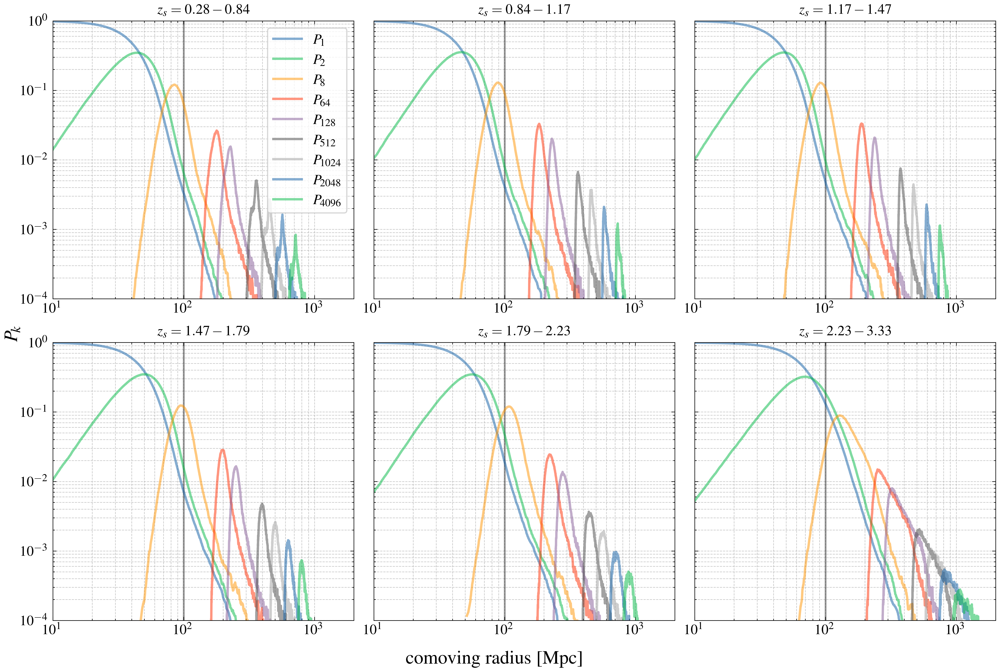

In [10]:
# Define the number of rows and columns for the grid
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 8), sharex=False, sharey=True)

# Indices to plot
iz_values = [0, 3, 8, 12, 15, 18]
kp = 8

# Flatten axes array for easy iteration
axes = axes.flatten()

for iz,zp in enumerate(zs[:-1]):
    colors = itertools.cycle(color_list)
    ax = axes[iz]  # Select subplot
    ax.axvline(100, color='k', linestyle='-', linewidth=1.5,alpha=0.4)  # Add vertical line at x=8
    for kp in [1, 2, 8, 64, 128, 512, 1024, 2048, 4096]:
        color = next(colors)
        ax.loglog(Pks[kp,iz].x, Pks[kp,iz].y, label=f"$P_{{{kp}}}$", color=color,alpha=0.5,linestyle='-',linewidth=2)

    # Titles per subplot
    ax.set_title(f"$z_s = {zs[iz]:.2f}-{zs[iz+1]:.2f}$", fontsize=12)
    
    # Axis limits
    ax.set_xlim([1e1, 2e3])
    ax.set_ylim([1e-4, 1])
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)    
    ax.tick_params(axis='both', which='both', labelsize=12)  # Adjust size as needed

# Shared labels
fig.supxlabel("comoving radius [Mpc]", fontsize=16)
fig.supylabel("$P_k$", fontsize=16)

# Place the legend inside one of the subplots (e.g., axes[0])
axes[0].legend(loc="best", fontsize=12, frameon=True)
# Adjust layout for clarity
plt.tight_layout()
plt.show()

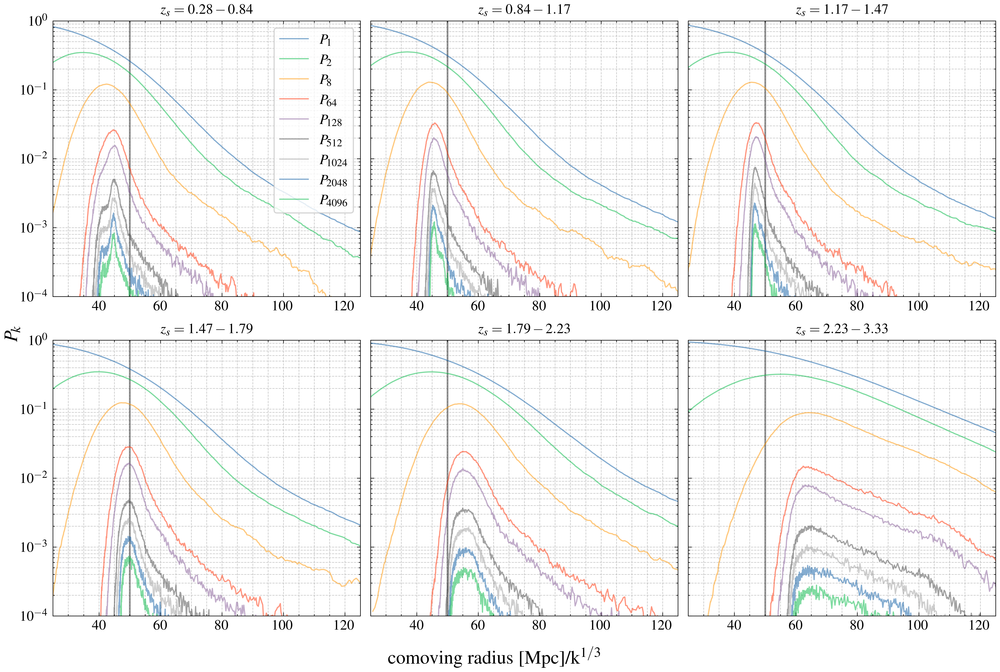

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of rows and columns for the grid
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 8), sharex=False, sharey=True)

# Flatten axes array for easy iteration
axes = axes.flatten()

for iz,zp in enumerate(zs[:-1]):
    colors = itertools.cycle(color_list)
    ax = axes[iz]  # Select subplot
    ax.axvline(50, color='k', linestyle='-', linewidth=1.5,alpha=0.4)  # Add vertical line at x=8

    for kp in [1, 2, 8, 64, 128, 512, 1024, 2048, 4096]:
        color = next(colors)
        meanR_Vbar = (Pks[kp,iz].x**3/kp)**(1/3)
        ax.loglog(meanR_Vbar, Pks[kp,iz].y, label=f"$P_{{{kp}}}$", color=color,alpha=0.5,linestyle='-',)
    
    # Titles per subplot
    ax.set_title(f"$z_s = {zs[iz]:.2f}-{zs[iz+1]:.2f}$", fontsize=12)
    
    # Axis limits
    ax.set_xlim([2.5e1, 1.25e2])
    ax.set_ylim([1e-4, 1])
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)    
    ax.tick_params(axis='both', which='both', labelsize=12)  # Adjust size as needed
    ax.set_xscale('linear')

# Shared labels
fig.supxlabel(r"comoving radius [Mpc]/k$^{1/3}$", fontsize=16)
fig.supylabel("$P_k$", fontsize=16)

# Place the legend inside one of the subplots (e.g., axes[0])
axes[0].legend(loc="best", fontsize=12, frameon=True)
# Adjust layout for clarity
plt.tight_layout()
plt.show()

In our 6 redshift bins we plot the probabilities $P_k$ which given a sphere centered on a data point denotes the probability it contains $k$ data points (solid lines). The dotted lines are the same probabilities computed on the random catalog. We see that the randoms (dotted lines) are more spread out than the data points. This is expected since the randoms are uniformly distributed in the survey volume. The data points are more clustered together. The clustering is more pronounced at intermediate and high redshifts. 

## Measure mean volume in randoms

In [12]:
rrdis, rrdisi =  rt.query(np.vstack([rf['x'],rf['y'],rf['z']]).T, k=ks, workers=-1) # query data tree at data points

In [13]:
# RR : data queried at the data points
rrPks = {}
rrcdfs = {}
for j, cz in enumerate(zs[:-1]):
    indi = np.where((rf["redshifts"] >= cz) & (rf["redshifts"] < zs[j+1]))[0]
    rrcdfs.update({(k,j): SEdist.SE_distribution(rrdis[indi,c],compress="log") for c,k in enumerate(ks)})
    for i,k in enumerate(ks):
        if i > 0:
            rrPks.update({(ks[i-1],j): 
                interp1d(rrcdfs[(k,j)].f.x,rrcdfs[(ks[i-1],j)].cdf(rrcdfs[(k,j)].f.x)-rrcdfs[(k,j)].cdf(rrcdfs[(k,j)].f.x), 
                         bounds_error=False,fill_value=(0,0)) 
                })
    rrPks.update({(1,j): 
                interp1d(rrcdfs[(2,j)].f.x, 1. - rrcdfs[(2,j)].cdf(rrcdfs[(2,j)].f.x), 
                         bounds_error=False,fill_value=(0,0)) 
                })

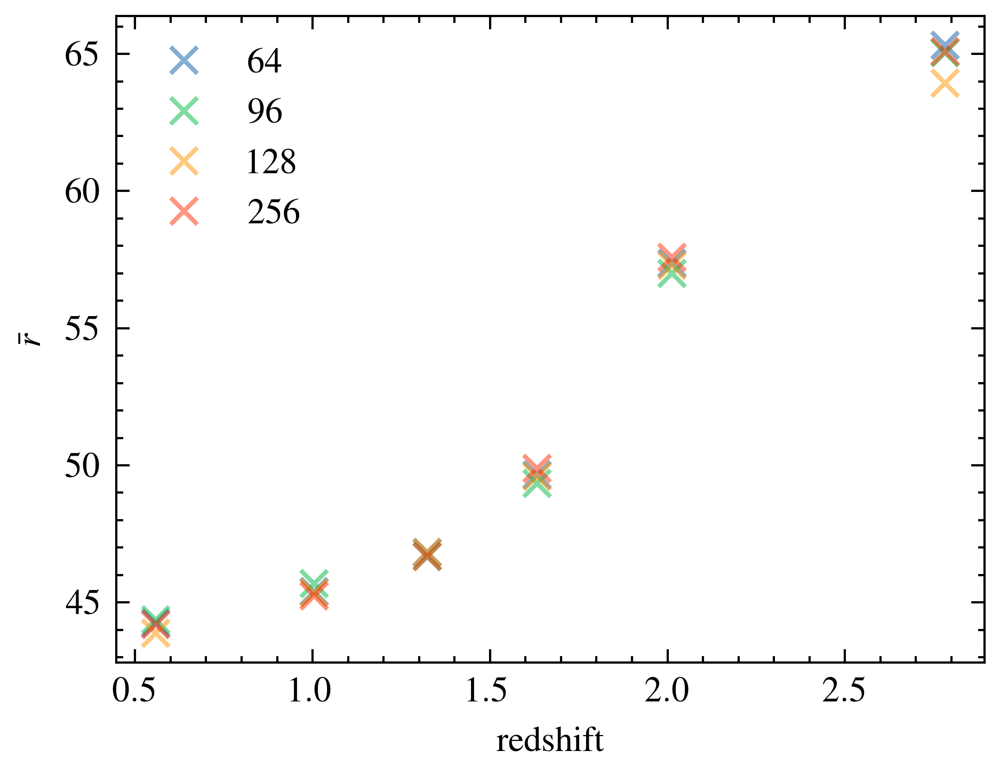

In [40]:
max_x_values = {}
rrmax_x_values = {}

for kp in [64, 96, 128, 256]:
    for iz in range(len(zs) - 1):
        rrmax_y_index = np.argmax(rrPks[kp, iz].y)
        rrmax_x_values[(kp, iz)] = rrPks[kp, iz].x[rrmax_y_index] / kp**(1/3)
        max_y_index = np.argmax(Pks[kp, iz].y)
        max_x_values[(kp, iz)] = Pks[kp, iz].x[max_y_index] / kp**(1/3)
    plt.plot(0.5*(zs[:-1]+zs[1:]), [rrmax_x_values[(kp, iz)] for iz in range(len(zs) - 1)], "x",
                label=f"{kp}",alpha=0.5)

plt.legend()
plt.xlabel("redshift")
plt.ylabel(r"$\bar{r}$");

rmean = {}
for iz in range(len(zs) - 1):
    rm = 0
    for kp in [64, 96, 128, 256]:
        rm += rrmax_x_values[(kp, iz)]
    rmean[iz] = rm / len([64, 96, 128, 256])
        

In [20]:
# saved results of finding number of randoms in a radius given sphere containing k data points
if False:
    indices = np.arange(df.shape[0])
    rocdfs = {}
    rol = np.zeros((len(indices),len(ks)))
    for c, k in enumerate(ks):
        rol[:,c] = rot.query_ball_point( (np.vstack([df['x'],df['y'],df['z']]).T)[indices,:], dis[indices,c], return_length=True, workers=-1)
        rocdfs[k] = SEdist.SE_distribution(rol[:,c], compress="log", Ninterpolants=5000)

    np.savez("rocdfs.npz", rocdfs=rocdfs, rol=rol)

In [21]:
rocdfs = np.load("rocdfs.npz", allow_pickle=True)["rocdfs"].item()
rol = np.load("rocdfs.npz", allow_pickle=True)["rol"]

In [22]:
np.array(ks)

array([   2,    3,    4,    5,    6,    7,    8,    9,   10,   11,   12,
         13,   14,   15,   16,   17,   18,   19,   20,   21,   22,   23,
         24,   25,   26,   27,   28,   29,   30,   31,   32,   33,   34,
         35,   36,   37,   38,   39,   40,   41,   42,   43,   44,   45,
         46,   47,   48,   49,   50,   51,   52,   53,   54,   55,   56,
         57,   58,   59,   60,   61,   62,   63,   64,   65,   66,   67,
         68,   69,   70,   71,   72,   73,   74,   75,   76,   77,   78,
         79,   80,   81,   82,   83,   84,   85,   86,   87,   88,   89,
         90,   91,   92,   93,   94,   95,   96,   97,   98,   99,  100,
        101,  102,  103,  104,  105,  106,  107,  108,  109,  110,  111,
        112,  113,  114,  115,  116,  117,  118,  119,  120,  121,  122,
        123,  124,  125,  126,  127,  128,  129,  256,  257,  512,  513,
       1024, 1025, 2048, 2049, 4096, 4097])

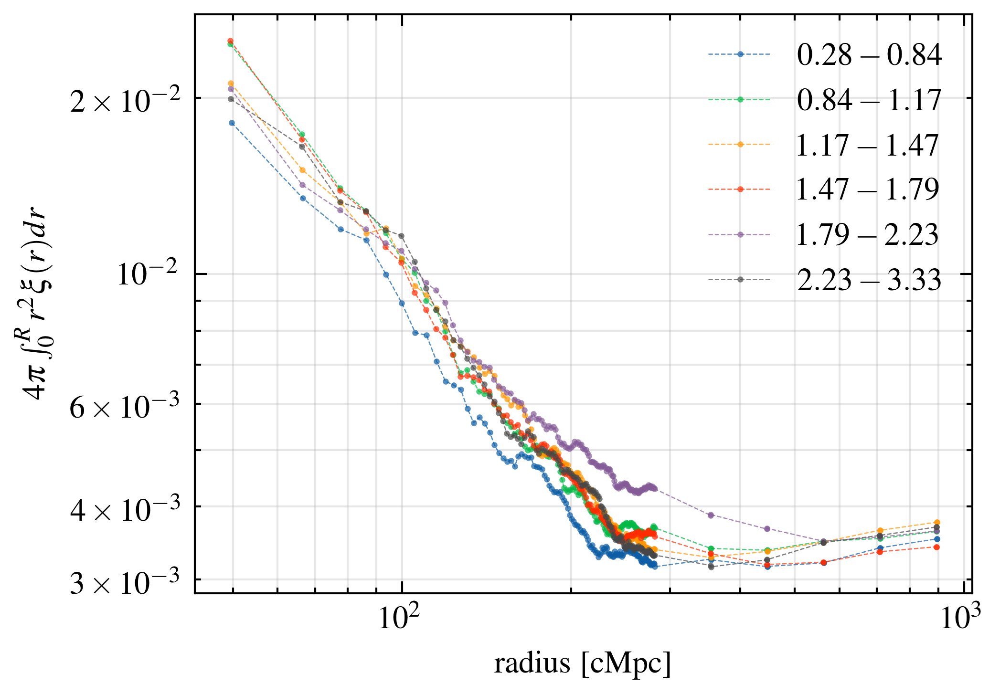

In [89]:

plt.style.use(['science'])
color_list = plt.rcParams["axes.prop_cycle"].by_key()["color"]

colors = itertools.cycle(color_list)
fzs = zs
for j, cz in enumerate(fzs[:-1]):
    indi = np.where((rf["redshifts"] >= cz) & (rf["redshifts"] < fzs[j+1]))[0]
    rho = rol[indi,:].mean(axis=0)**(-1) * (np.array(ks)-1) * rof.shape[0]/df.shape[0]
#    rho /= rho[-1]
    rho -= 1.
    color = next(colors)
    plt.plot(dis[indi,:].mean(axis=0),  rho, '--o', label=rf"${fzs[j]:.2f}-{fzs[j+1]:.2f}$",alpha=0.7,ms=0.5,lw=0.3,color=color)
#    plt.plot((dis[indi,:]**3).mean(axis=0)**(1/3),  rho, ':',alpha=0.7,ms=0.5,lw=0.7,color=color)
    
plt.xscale("log")
plt.yscale("log")
plt.legend()
plt.grid(which='both',axis='both',alpha=0.3)
#plt.ylim([5e-6,3e-3])
plt.ylabel(r"$4\pi \int_0^R r^2\xi(r) dr$")
plt.xlabel(r"radius [cMpc]");

The integrated two point correlation function evaluated at 

In [60]:
rof.shape[0]/df.shape[0], np.array(ks)

(10.000603627010996,
 array([   2,    3,    4,    5,    6,    7,    8,    9,   10,   11,   12,
          13,   14,   15,   16,   17,   18,   19,   20,   21,   22,   23,
          24,   25,   26,   27,   28,   29,   30,   31,   32,   33,   34,
          35,   36,   37,   38,   39,   40,   41,   42,   43,   44,   45,
          46,   47,   48,   49,   50,   51,   52,   53,   54,   55,   56,
          57,   58,   59,   60,   61,   62,   63,   64,   65,   66,   67,
          68,   69,   70,   71,   72,   73,   74,   75,   76,   77,   78,
          79,   80,   81,   82,   83,   84,   85,   86,   87,   88,   89,
          90,   91,   92,   93,   94,   95,   96,   97,   98,   99,  100,
         101,  102,  103,  104,  105,  106,  107,  108,  109,  110,  111,
         112,  113,  114,  115,  116,  117,  118,  119,  120,  121,  122,
         123,  124,  125,  126,  127,  128,  129,  256,  257,  512,  513,
        1024, 1025, 2048, 2049, 4096, 4097]))

(0.3, 3.0)

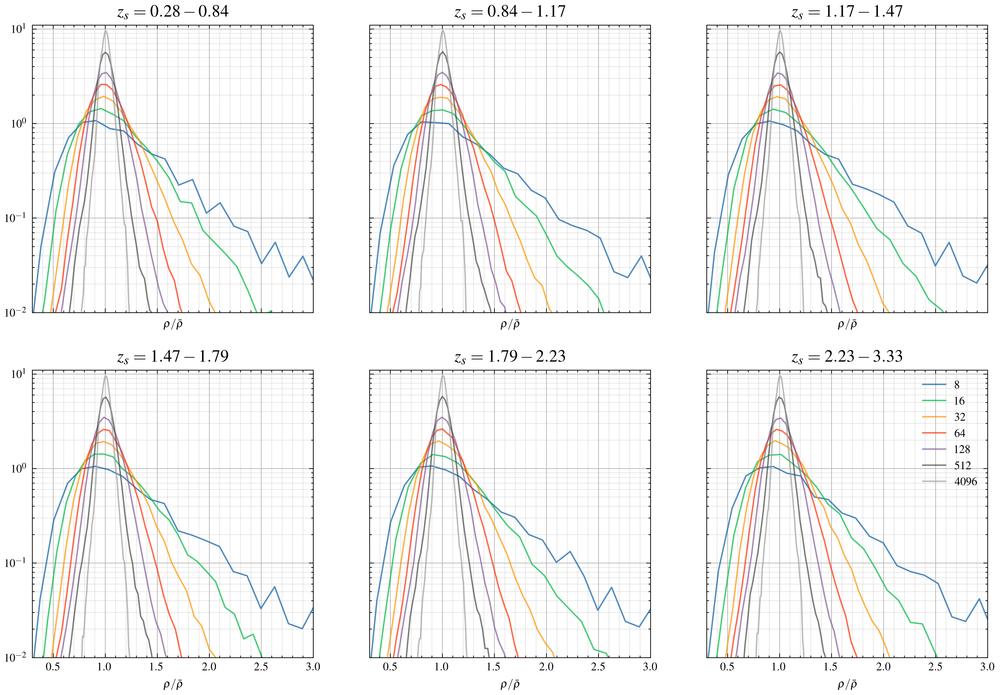

In [76]:
# Define the number of rows and columns for the grid
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 8), sharex=True, sharey=True)

# Flatten axes array for easy iteration
axes = axes.flatten()
for j, cz in enumerate(zs[:-1]):
    colors = itertools.cycle(color_list)
    indi = np.where((rf["redshifts"] >= cz) & (rf["redshifts"] < fzs[j+1]))[0]
#    rho /= rho[-1]
#    rho -= 1.
    ax = axes[j]
    for i,k in enumerate([ 9, 17, 33, 65, 129, 513, 4097]):
        color = next(colors)
        kind = np.where( np.array(ks) == k)[0][0]
#        print(k, kind)
        rho2 = (dis[indi, kind]/(k-1)**(1/3)/rmean[j])**(-3)
        rho = (k-1)/(rol[indi, kind]) * rof.shape[0]/df.shape[0]
        rho = rho[rho < np.inf]
#        print(np.min(rho),np.max(rho))
        my_b = np.linspace(np.max([0.1,np.min(rho)]) , np.min([8,np.max(rho)]), 60)
#        print(my_b)
        h, xe = np.histogram(rho, bins=my_b, density=True)
#        h2, xe = np.histogram(rho2, bins=my_b, density=True)
        xc = (xe[0:-1] + xe[1:])/2
        ax.plot(xc, h,'-',alpha=0.7,ms=1.5, label=f"{{{k-1}}}",color=color)
#        ax.plot(xc, h2,'--',alpha=0.7,ms=1.5,color=color)
    ax.set_title(f"$z_s = {zs[j]:.2f}-{zs[j+1]:.2f}$", fontsize=12)
    ax.grid(which='minor',axis='both',alpha=0.3)
    ax.grid(axis='both',alpha=0.9)
    ax.set_xlabel(r"$\rho/{\bar \rho}$");
plt.xscale("linear")
plt.yscale("log")
plt.legend()
plt.ylim([1e-2,1.1e1])
plt.xlim([3e-1,3e0])


For spheres centered on our data points, and contain $k$ data points, this gives the PDF of the density. This is calculated by comparing the number of data points enclosed in spheres containing $k$ data points with the number of points in the random catalog found in the same spheres. Given that this is based on density points this is a mass weighted PDF and should not be mistaken for the volume weighted PDF. 

In [48]:
rho = (rol[indi, 17]) * rof.shape[0]/df.shape[0]


In [78]:
rho = np.zeros_like(rol)
for i, k in enumerate(ks):
    rho[:,i] = (k-1)/(rol[:, i]) * rof.shape[0]/df.shape[0]

/var/folders/8h/csrqy1dd1x1d93qvzyh33kn40000gn/T/ipykernel_87426/2499391472.py:3: RuntimeWarning: divide by zero encountered in divide
  rho[:,i] = (k-1)/(rol[:, i]) * rof.shape[0]/df.shape[0]


In [80]:
rho.shape

(1295502, 138)

In [81]:
rho[:,3]

array([1.08114634, 1.90487688, 1.73923541, ..., 1.1765416 , 0.54797828,
       0.75476254])

In [84]:
import k3d
from scipy.spatial import distance
import threading
import time

# Create a plot
plot = k3d.plot()

# Calculate the distance of each point from the origin
distances = np.sqrt(df['x']**2 + df['y']**2 + df['z']**2)

# Find the radius that encompasses 99% of the points
radius_50 = np.percentile(distances, 50)
print("redshift containing half the points:", df["redshift_quaia"][distances < radius_50].max())

# Generate sphere vertices and faces
#vertices, faces = utils.generate_sphere(radius=radius_50, center=(0, 0, 0), resolution=30)

# Create a mesh for the sphere
#sphere_mesh = k3d.mesh(vertices, faces, color=0xff0000, opacity=0.3, wireframe=True)
# Add the sphere to the plot
#plot += sphere_mesh

# Label the sphere with its redshift value
label = k3d.text(
    text=f'Redshift: {np.percentile(df["redshift_quaia"], 99):.2f}',
    position=[radius_50, 0, 0],
    color=0xff0000,
    size=1.0
)

# Add the label to the plot
#plot += label

# Create a 3D scatter plot
#colors = np.float32(df['redshift_quaia'].values)
colors = np.float32(rho[:,5]) # pick the __th neighbour density
points = k3d.points(positions=np.vstack([df['x'],df['y'],df['z']]).T, 
                    point_size=5, color_map=k3d.colormaps.matplotlib_color_maps.Greys, 
                    attribute=colors)

# Add animation to rotate the plot
# Add animation to rotate the plot
plot.camera_auto_fit = True


# Add points to the plot
plot += points

# Display the plot
plot.display()


plot.start_auto_play()

redshift containing half the points: 1.4737917184829712


Output()

In [30]:
Pks_stats = {}
for (k,j), f in Pks.items():
    mean = np.sum((f.x*f.y))/np.sum(f.y)
    var = np.sum((f.x-mean)**2*f.y)/np.sum(f.y)
    std = np.sqrt(var)
    Pks_stats.update({(k,j): (mean, var, std)})

KeyError: (1, 6)

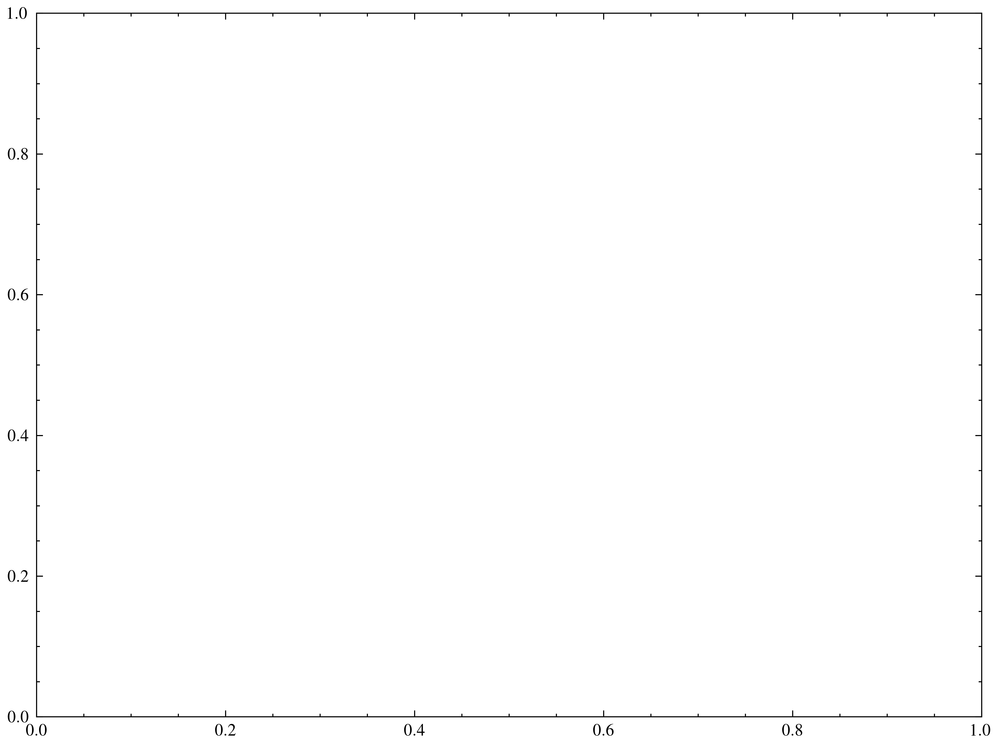

In [31]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))

for k in [1,8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    stds  = [Pks_stats[(k, j)][2] for j in range(len(zs))]  # Std deviation values
    
    # Plot mean and std as a function of redshift
    ax.plot(zs, means, label=f"$P_{{{k}}}$ mean", marker='o')
    ax.fill_between(zs, np.array(means) - np.array(stds), 
                    np.array(means) + np.array(stds), alpha=0.2)

# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=12)
ax.set_ylabel("Mean and Standard Deviation", fontsize=12)
ax.set_title("Evolution of Mean and Standard Deviation with Redshift", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)



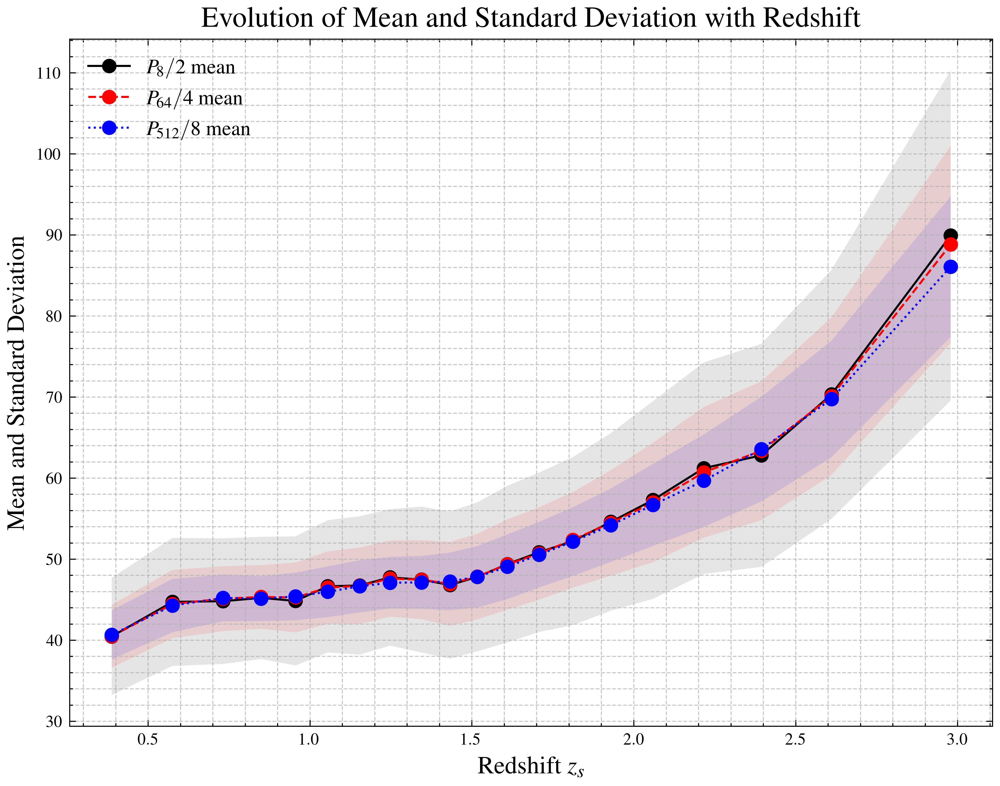

In [ ]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))

for k in [8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    stds  = [Pks_stats[(k, j)][2] for j in range(len(zs))]  # Std deviation values
    
    kscale = k**(1/3)
    # Plot mean and std as a function of redshift
    ax.plot(zs, np.array(means)/kscale, label=f"$P_{{{k}}}/{{{np.int64(np.round(kscale))}}}$ mean", marker='o')
    ax.fill_between(zs, np.array(means)/kscale - np.array(stds)/kscale, 
                    np.array(means)/kscale + np.array(stds)/kscale , alpha=0.1)

# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=12)
ax.set_ylabel("Mean and Standard Deviation", fontsize=12)
ax.set_title("Evolution of Mean and Standard Deviation with Redshift", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)



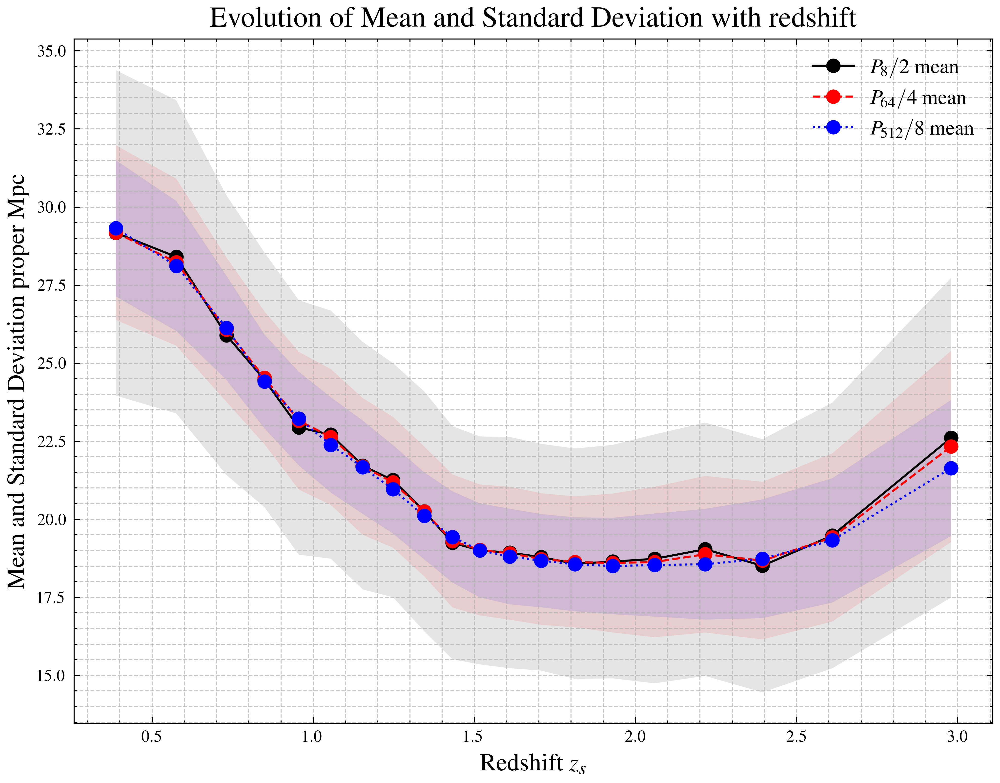

In [ ]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))

for k in [8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    stds  = [Pks_stats[(k, j)][2] for j in range(len(zs))]  # Std deviation values
    
    kscale = k**(1/3)
    # Plot mean and std as a function of redshift
    ax.plot(zs, np.array(means)/kscale/(1+zs), label=f"$P_{{{k}}}/{{{np.int64(np.round(kscale))}}}$ mean", marker='o')
    ax.fill_between(zs, np.array(means)/kscale/(1+zs) - np.array(stds)/kscale/(1+zs), 
                    np.array(means)/kscale/(1+zs) + np.array(stds)/kscale/(1+zs) , alpha=0.1)

# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=12)
ax.set_ylabel("Mean and Standard Deviation proper Mpc ", fontsize=12)
ax.set_title("Evolution of Mean and Standard Deviation with redshift", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)



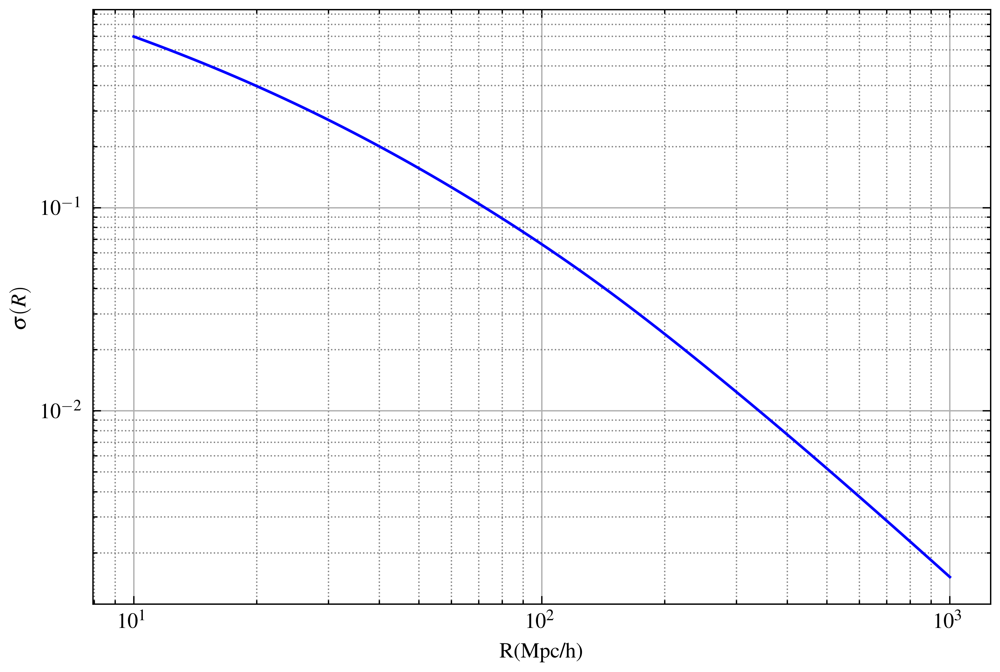

In [ ]:
from colossus.cosmology import cosmology
cosmo = cosmology.setCosmology('planck15')
ps_args = dict(model = 'camb', kmax = 5E4, kmin=1e-5, ps_type = 'cdm')

R = 10**np.linspace(1.0, 3., 500)

sigma = cosmo.sigma(R)

plt.figure(figsize=(6,4))
plt.loglog()
plt.xlabel('R(Mpc/h)')
plt.ylabel(r'$\sigma(R)$')
plt.grid()
plt.plot(R,  sigma, 'b-');
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')


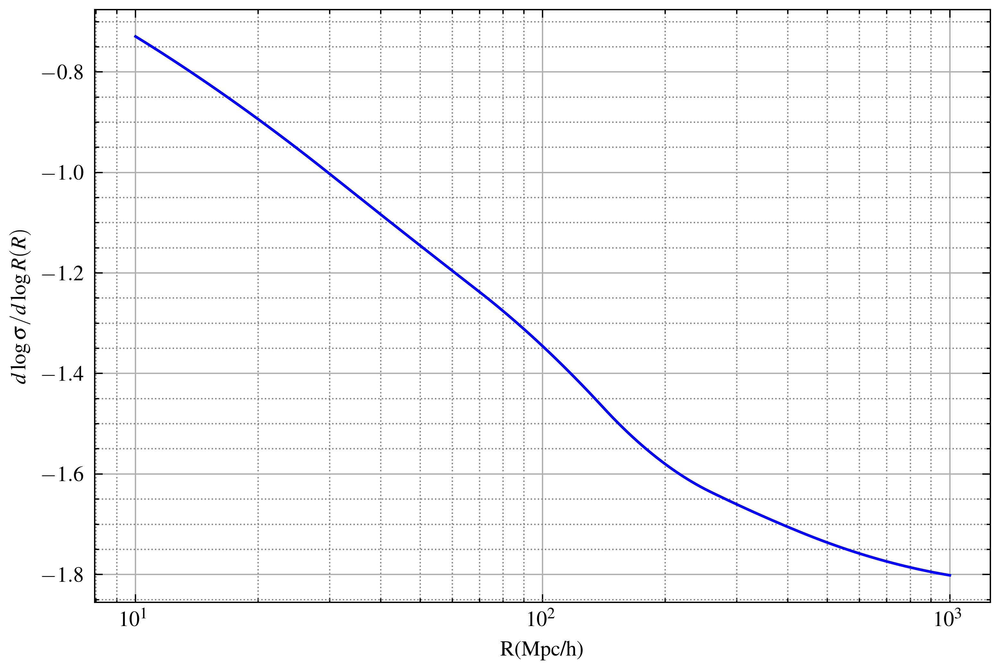

In [ ]:
from colossus.cosmology import cosmology
cosmo = cosmology.setCosmology('planck15')
ps_args = dict(model = 'camb', kmax = 5E4, kmin=1e-5, ps_type = 'cdm')

R = 10**np.linspace(1.0, 3., 500)

dlogsigmadR = cosmo.sigma(R,derivative=True)

plt.figure(figsize=(6,4))
plt.semilogx()
plt.xlabel('R(Mpc/h)')
plt.ylabel(r'$d\log\sigma/d\log R(R)$')
plt.grid()
plt.plot(R,  dlogsigmadR, 'b-');
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')


$$
\Delta R = R_0 \left( (1+\Delta \delta)^{-1/3} - 1 \right)
$$

(0.0, 660.0)

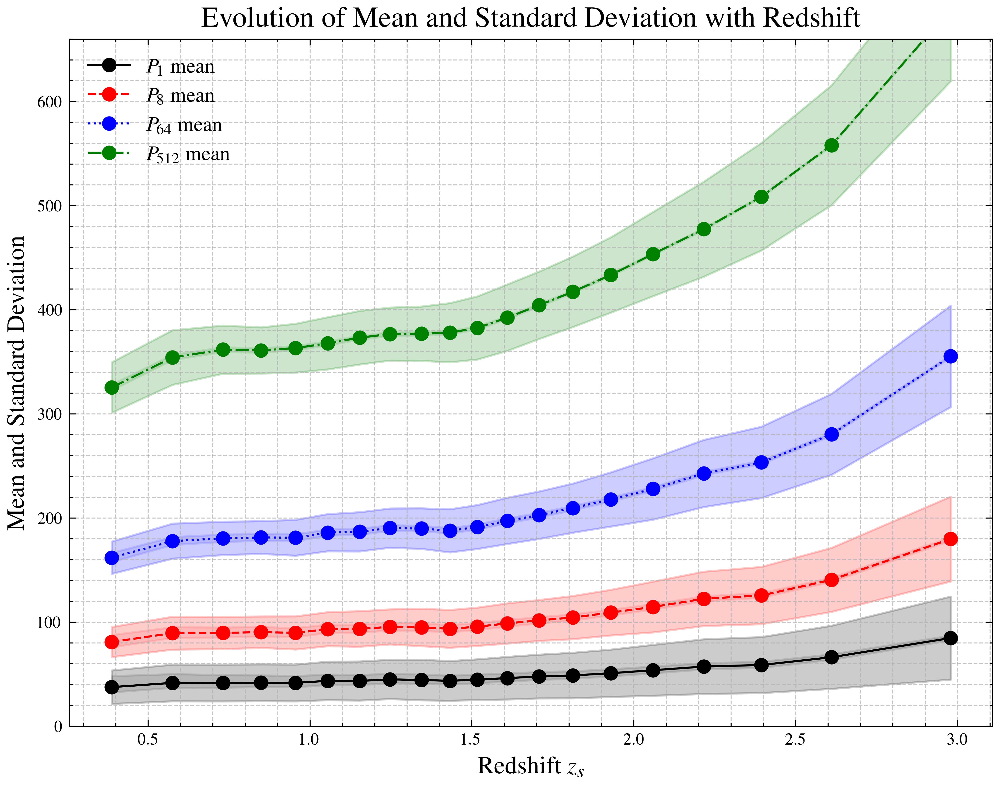

In [ ]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))

# Create an iterator
colors = itertools.cycle(color_list)

for k in [1,8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    stds  = [Pks_stats[(k, j)][2] for j in range(len(zs))]  # Std deviation values

    sigmas = np.array([cosmo.sigma(means[c], z) for c, z in enumerate(zs)] ) # collect sigmas and turn it into sigma of radii
    Rp = means*((1+3*sigmas)**(-1/3))
    Rm = means*((1-3*sigmas)**(-1/3))
    # Plot mean and std as a function of redshift
    color = next(colors)
    ax.plot(zs, means, label=f"$P_{{{k}}}$ mean", marker='o', color=color)
    ax.fill_between(zs, np.array(means) - np.array(stds), 
                    np.array(means) + np.array(stds), alpha=0.2, color=color)
    ax.fill_between(zs, Rm, 
                    Rp, alpha=0.1, color=color)
#    ax.plot(zs, means*(1+sigmas),'--', color=color)
#    ax.plot(zs, means*(1-sigmas),'--', color=color)

# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=12)
ax.set_ylabel("Mean and Standard Deviation", fontsize=12)
ax.set_title("Evolution of Mean and Standard Deviation with Redshift", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.ylim([0,660])


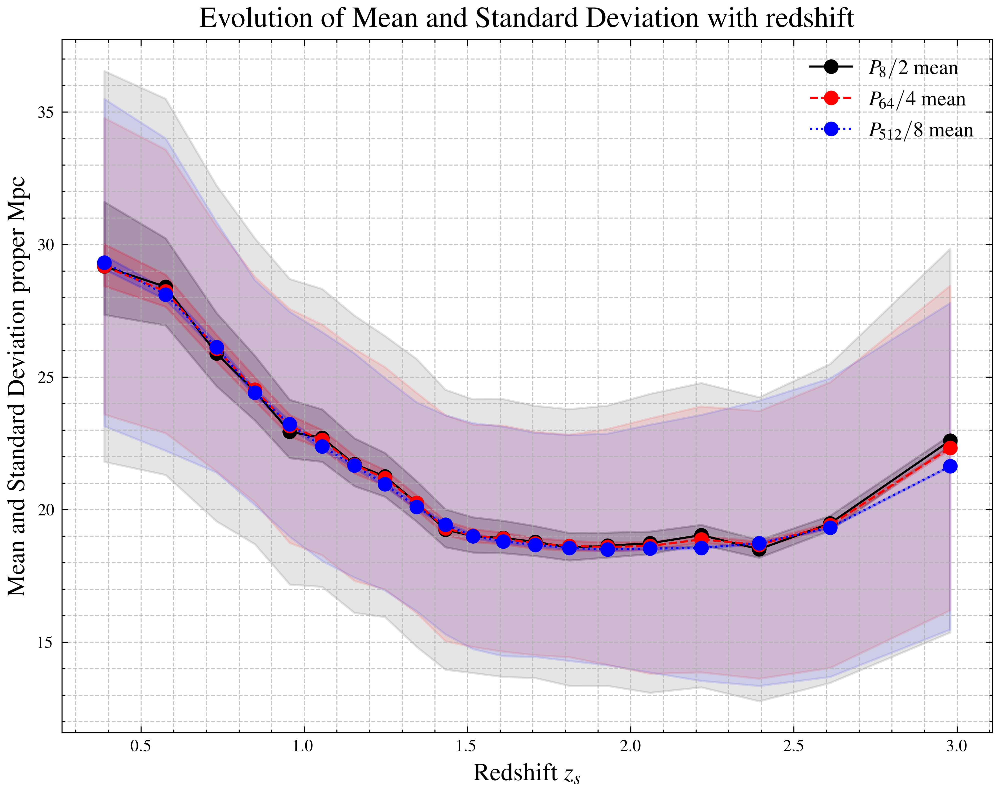

In [ ]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))
colors = itertools.cycle(color_list)

for k in [8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    stds  = [Pks_stats[(k, j)][2] for j in range(len(zs))]  # Std deviation values
    sigmas = np.array([cosmo.sigma(means[c], z) for c, z in enumerate(zs)] ) # collect sigmas and turn it into sigma of radii
    Rp = means*((1+3*sigmas)**(-1/3))
    Rm = means*((1-3*sigmas)**(-1/3))
    
    color = next(colors)
    kscale = k**(1/3)
    # Plot mean and std as a function of redshift
    ax.plot(zs, np.array(means)/kscale/(1+zs), label=f"$P_{{{k}}}/{{{np.int64(np.round(kscale))}}}$ mean", marker='o',color=color)
    ax.fill_between(zs, np.array(means)/kscale/(1+zs) - np.array(stds)/kscale**0.5/(1+zs), 
                    np.array(means)/kscale/(1+zs) + np.array(stds)/kscale**0.5/(1+zs) , alpha=0.1,color=color)
    ax.fill_between(zs, Rp/kscale/(1+zs), Rm/kscale/(1+zs) , alpha=0.2,color=color)

# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=12)
ax.set_ylabel("Mean and Standard Deviation proper Mpc ", fontsize=12)
ax.set_title("Evolution of Mean and Standard Deviation with redshift", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)



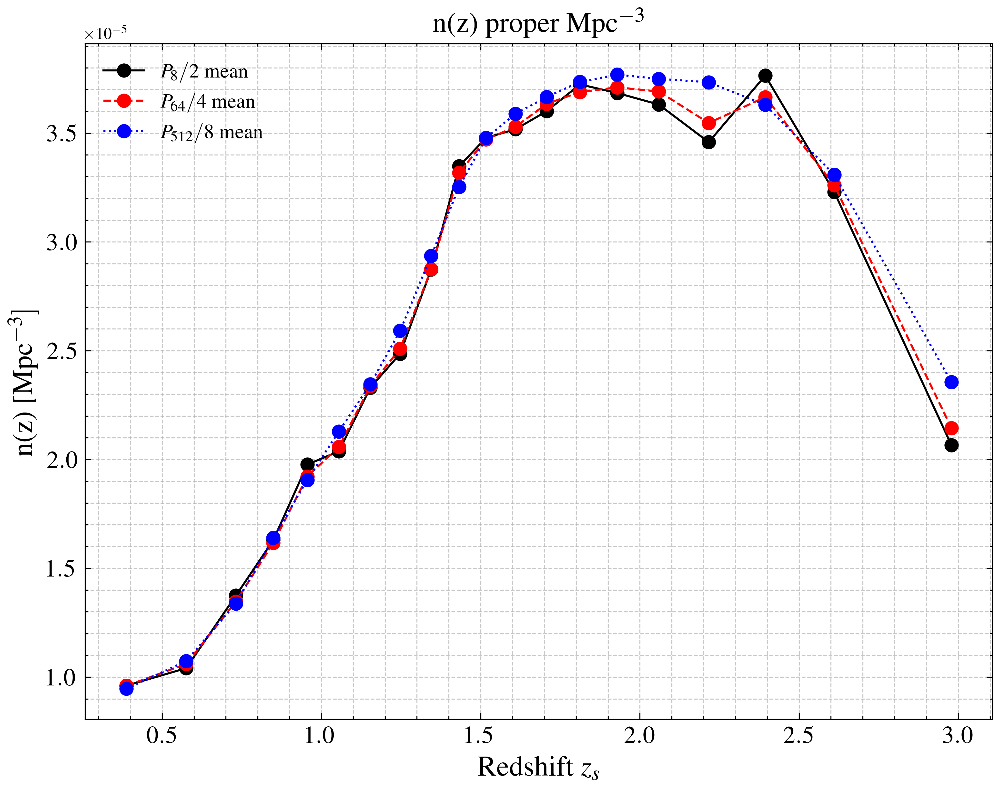

In [ ]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))
colors = itertools.cycle(color_list)

for k in [8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    stds  = [Pks_stats[(k, j)][2] for j in range(len(zs))]  # Std deviation values
    sigmas = np.array([cosmo.sigma(means[c], z) for c, z in enumerate(zs)] ) # collect sigmas and turn it into sigma of radii
    Rp = means*((1+3*sigmas)**(-1/3))
    Rm = means*((1-3*sigmas)**(-1/3))
    
    color = next(colors)
    kscale = k**(1/3)
    
    Rproper = np.array(means)/kscale/(1+zs)
    dRproper = np.array(stds)/kscale**0.5/(1+zs)
    Vbar = 4.*np.pi/3*Rproper**3
    nbar = 1/Vbar
    
    # Plot mean and std as a function of redshift
    ax.plot(zs,  nbar, label=f"$P_{{{k}}}/{{{np.int64(np.round(kscale))}}}$ mean", marker='o',color=color)
#    ax.fill_between(zs, 1/(4.*np.pi/3*(Rproper-dRproper)**3), 1/(4.*np.pi/3*(Rproper+dRproper)**3) , alpha=0.1,color=color)
#ax.set_yscale("log")
# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=14)
ax.set_ylabel(r"n(z) [Mpc$^{-3}]$ ", fontsize=14)
ax.tick_params(axis='both', which='both', labelsize=12)  # Adjust size as needed

ax.set_title(r"n(z) proper Mpc$^{-3}$", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)



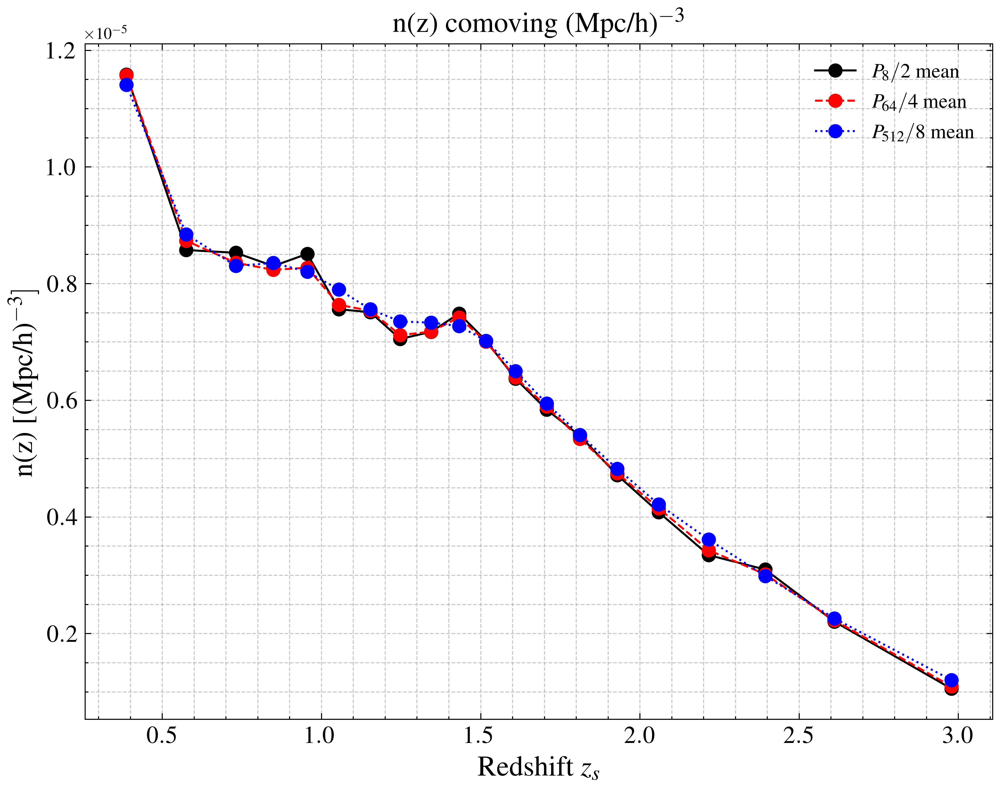

In [ ]:
ks_values = sorted(set(k for k, _ in Pks_stats.keys()))  # Unique sorted k values
fig, ax = plt.subplots(figsize=(8, 6))
colors = itertools.cycle(color_list)
u.add_enabled_units(cu)
for k in [8,64,512]:
    means = [Pks_stats[(k, j)][0] for j in range(len(zs))]  # Mean values
    
    color = next(colors)
    kscale = k**(1/3)
    
    Rcom = np.array(means)*u.l * default_cosmo.h/kscale
    
    dRproper = np.array(stds)/kscale**0.5
    Vbar = 4.*np.pi/3*Rcom**3
    nbar = 1/Vbar
    
    # Plot mean and std as a function of redshift
    ax.plot(zs,  nbar, label=f"$P_{{{k}}}/{{{np.int64(np.round(kscale))}}}$ mean", marker='o',color=color)

# Labels and legend
ax.set_xlabel("Redshift $z_s$", fontsize=14)
ax.set_ylabel(r"n(z) [(Mpc/h)$^{-3}]$ ", fontsize=14)
ax.tick_params(axis='both', which='both', labelsize=12)  # Adjust size as needed

ax.set_title(r"n(z) comoving (Mpc/h)$^{-3}$", fontsize=14)
ax.legend(fontsize=10, loc="best")
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)



In [ ]:
default_cosmo.h

0.6774

# Correlate with bolometric luminosity

In [ ]:

# Read CSV file into DataFrame
lf = pd.read_csv("../../data/quaia/Quaia_z15.csv")

# Display the first few rows
print(lf.head())

   Unnamed: 0       source_id      unwise_objid  redshift_quaia  \
0           0   6459630980096  0453p000o0014479        0.416867   
1           6  31026843960576  0453p000o0017859        0.821638   
2           7  35115652874752  0453p000o0020193        0.803480   
3           9  47931835055360  0453p000o0020960        1.036263   
4          12  54528905041920  0453p000o0019611        1.115134   

   redshift_quaia_err         ra       dec           l          b  \
0            0.062063  44.910498  0.189649  176.659434 -48.835164   
1            0.063872  44.938163  0.419152  176.439321 -48.655247   
2            0.070416  44.991067  0.581729  176.319533 -48.503757   
3            0.097702  45.615455  0.631120  176.919899 -48.021552   
4            0.086451  45.174057  0.543771  176.553217 -48.399351   

   phot_g_mean_mag  phot_bp_mean_mag  phot_rp_mean_mag  mag_w1_vg  mag_w2_vg  \
0        20.173105         20.200150         18.871586  14.774343  13.923867   
1        20.237946    

In [ ]:
lf.shape, df.shape, rof.shape

((670578, 16), (1295502, 21), (12955802, 7))

In [ ]:
lf.keys()

Index(['Unnamed: 0', 'source_id', 'unwise_objid', 'redshift_quaia',
       'redshift_quaia_err', 'ra', 'dec', 'l', 'b', 'phot_g_mean_mag',
       'phot_bp_mean_mag', 'phot_rp_mean_mag', 'mag_w1_vg', 'mag_w2_vg',
       'loglbol_rp', 'loglbol_corr'],
      dtype='object')

### Given the distances now measure the volume
By measuring how many randoms are in the spheres of the size to the k-th nearest data point we get a volume estimate exploiting the randoms property of being uniformly distributed. 

In [ ]:
indices = np.random.choice(len(rf['x']), 3_000_000, replace=False)  # downsample [is faster]
#indices = np.arange(len(rf['x']))
rl = np.zeros((len(indices),len(ks)))
for c, k in enumerate(ks):
    rl[:,c] = rt.query_ball_point( (np.vstack([rf['x'],rf['y'],rf['z']]).T)[indices,:], dis[indices,c], return_length=True, workers=-1)
    cdfs[k] = SEdist.SE_distribution(rl[:,c], compress="log", Ninterpolants=50000)
#cdfs[k] = SEdist.SE_distribution(rl)
    

KeyboardInterrupt: 

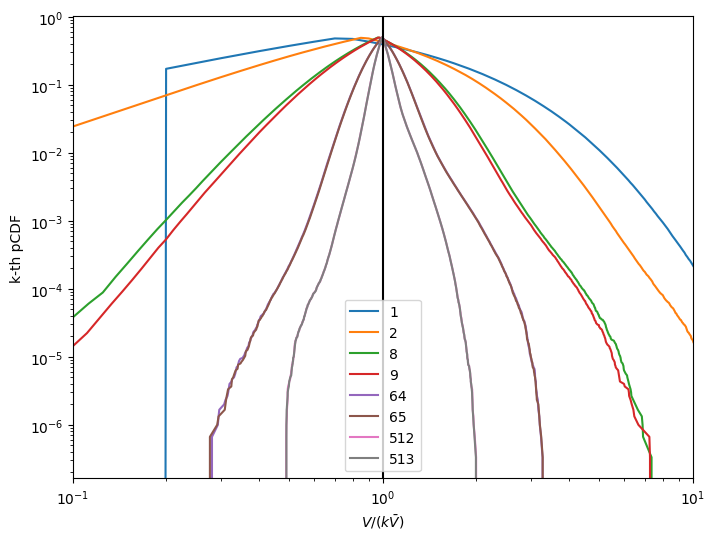

In [ ]:
fig = plt.figure(figsize=(8,6))

for c, k in enumerate(ks):
    plt.loglog(cdfs[k].x()/k/10, cdfs[k].pcdf(cdfs[k].x()),label=str(k))
plt.axvline(1,color='black')
plt.xlabel(r'$V/(k\bar{V})$')
plt.ylabel(r'k-th pCDF')
plt.xlim([1e-1,1e1])
plt.legend();

Equation 8 of [Banerjee & Abel 2022](https://doi.org/10.1093/mnras/staa3604) :
$$
P_{k \mid V}=\mathrm{CDF}_{k \mathrm{NN}}(r)-\mathrm{CDF}_{(k+1) \mathrm{NN}}(r) \quad \forall k \geq 1
$$


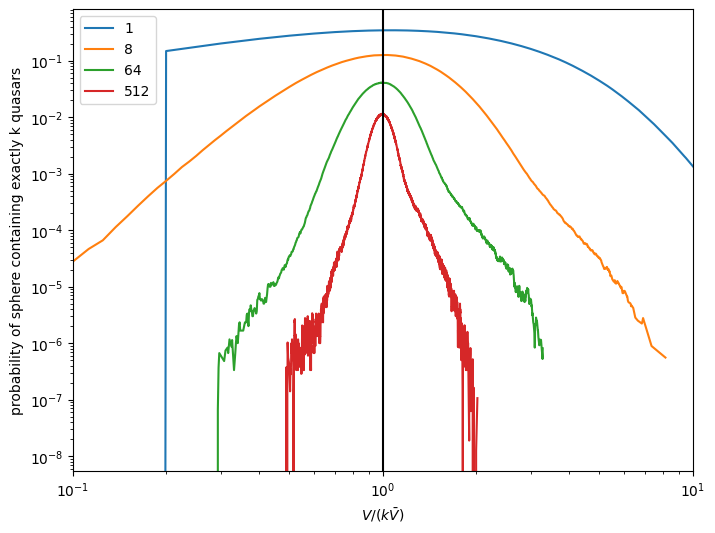

In [ ]:
# P_k
fig = plt.figure(figsize=(8,6))
for c, k in enumerate(ks[::2]):
    plt.loglog(cdfs[k].x()/k/10, cdfs[k].cdf(cdfs[k].x())-cdfs[k+1].cdf(cdfs[k].x()),label=str(k))
plt.axvline(1,color='black')
plt.xlabel(r'$V/(k\bar{V})$')
plt.ylabel(r'probability of sphere containing exactly k quasars')
plt.xlim([1e-1,1e1])
plt.legend();

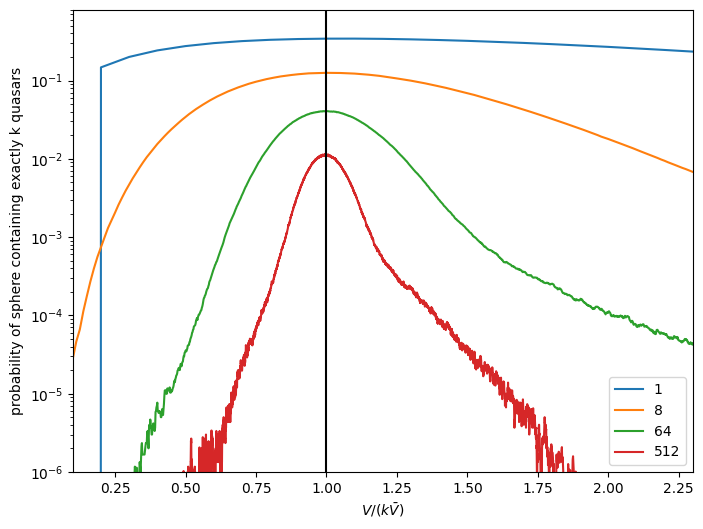

In [ ]:
# P_k
fig = plt.figure(figsize=(8,6))
for c, k in enumerate(ks[::2]):
    plt.semilogy(cdfs[k].x()/k/10, cdfs[k].cdf(cdfs[k].x())-cdfs[k+1].cdf(cdfs[k].x()),label=str(k))
plt.axvline(1,color='black')
plt.xlabel(r'$V/(k\bar{V})$')
plt.ylabel(r'probability of sphere containing exactly k quasars')
plt.xlim([1e-1,2.3])
plt.ylim([1e-6,0.8])
plt.legend();

In [ ]:
vols = 4*np.pi/3 * dis[indices,:]**3
vcdfs = {}
for c, k in enumerate(ks):
    vcdfs[k] = SEdist.SE_distribution(vols[:,c], compress="log", Ninterpolants=50000)
    
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))


<Figure size 4800x3600 with 0 Axes>

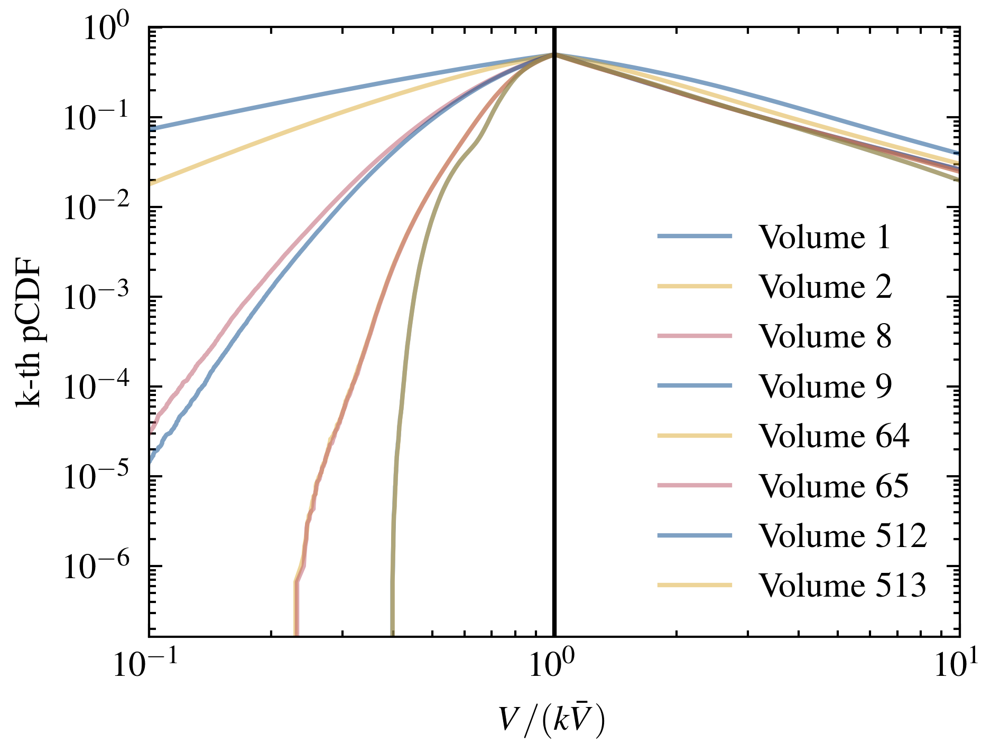

In [ ]:
for c, k in enumerate(ks):
    color = plt.gca()._get_lines.get_next_color()
    plt.loglog(vcdfs[k].x()/vcdfs[k].median(), vcdfs[k].pcdf(vcdfs[k].x()), label=f'Volume {k}', color=color,alpha=0.5,lw=2)
#    plt.loglog(cdfs[k].x()/k/10, cdfs[k].pcdf(cdfs[k].x()),label=str(k), color=color)
plt.axvline(1,color='black')
plt.xlabel(r'$V/(k\bar{V})$')
plt.ylabel(r'k-th pCDF')
plt.xlim([1e-1,1e1])
plt.legend();

In [ ]:
def plot_2d_cdf(xx, yy, xlabel="", ylabel=""):
    def gridECDF2D(xx, yy, xgi, ygi):
        # Ensure bin edges fully cover data range and are strictly increasing
        # Extend the first and last bin with -inf and +inf
        x_bins = np.concatenate(([ -np.inf ], xgi, [ np.inf ]))
        y_bins = np.concatenate(([ -np.inf ], ygi, [ np.inf ]))
        # Compute 2D histogram
        h2d, xe, ye = np.histogram2d(xx, yy, bins=(x_bins, y_bins))
        # Compute 2D ECDF
        cdf = np.cumsum(np.cumsum(h2d, axis=0), axis=1) / len(xx)
        return cdf[0:-1,0:-1].T

    se1 = SEdist.SE_distribution(xx, compress="log")
    se2 = SEdist.SE_distribution(yy, compress="log")

    Nh = 200
    xgi = np.linspace(se1.ppf(1e-8), se1.ppf(1-1e-8), Nh)
    ygi = np.linspace(se2.ppf(1e-8), se2.ppf(1-1e-8), Nh)

    ells = np.linspace(0, 1, 11)
    ells[0] = 1e-4
    ells[10] = 1-1e-4

    # JOINT CDF, PEAKED CDF AND PDF 
    from mpl_toolkits.axes_grid1 import ImageGrid
    fig = plt.figure(figsize=(13, 6))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.45, cbar_mode="each", cbar_location="right", cbar_pad=0.1)

    # CDF
    cdf2 = gridECDF2D(xx, yy, xgi, ygi)
    cc = grid[0].imshow(cdf2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], alpha=0.7)

    grid[0].contour(cdf2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], colors="black", alpha=.5, levels=ells)
    uncdf2 = np.outer(se1.cdf(xgi), se2.cdf(ygi)).T  # if it were uncorrelated then it is product of marginals

    grid[0].contour(uncdf2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], linewidths=1, colors="red", alpha=.5, levels=ells)

    grid[0].set_title("CDF")
    grid[0].set_xlabel(xlabel)
    grid[0].set_ylabel(ylabel)
    grid.cbar_axes[0].colorbar(cc)

    # PCDF
    pcdf2 = np.minimum(cdf2, 1-cdf2)  # peaked CDF
    cc = grid[1].imshow(pcdf2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], interpolation='spline36', alpha=0.7)
    grid[1].contour(cdf2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], colors="black", alpha=.6, levels=ells)
    grid[1].set_title("PCDF")
    unpcdf2 = np.minimum(uncdf2, 1-uncdf2)  # peaked CDF

    grid[1].contour(unpcdf2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], linewidths=1, colors="red", alpha=.5, levels=ells)

    # Create 'proxy' line artists (these won't actually be plotted)
    import matplotlib.lines as mlines
    black_line = mlines.Line2D([], [], color='black', label='actual')
    red_line = mlines.Line2D([], [], color='red', label='uncorrelated')

    grid[1].legend(handles=[black_line, red_line])

    grid[1].set_xlabel(xlabel)
    grid.cbar_axes[1].colorbar(cc)

    # PDF
    grad2 = np.gradient(cdf2, xgi, axis=0)
    der2 = np.gradient(grad2.reshape(Nh, Nh), ygi, axis=1)
    ga2 = der2
    ccc = grid[2].imshow(ga2, origin='lower', extent=[xgi.min(), xgi.max(), ygi.min(), ygi.max()], alpha=0.7)

    grid[2].set_title(r"$PDF=\partial^2 CDF/\partial x \partial y$")
    grid[2].set_xlabel(xlabel)
    grid.cbar_axes[2].colorbar(ccc)
#    for ax in grid:
    #        ax.set_aspect('equal', adjustable='box', anchor='C')
    for ax in grid:
#        ax.set_aspect(1)  # Force square aspect ratio
        ax.set_xlim(xgi.min(), xgi.max())  # Maintain correct x-axis limits
        ax.set_ylim(ygi.min(), ygi.max())  # Maintain correct y-axis limits
        ax.set_aspect(abs((xgi.max() - xgi.min()) / (ygi.max() - ygi.min())), adjustable='box')
    plt.show()

    return cdf2

# Example usage:
# cdf2 = plot_2d_cdf(xy[0], xy[1], xlabel="redshift", ylabel=r"$log_{10}(V)$")

# Example usage:
# cdf2 = plot_2d_cdf(xy[0], xy[1], xgi, ygi)


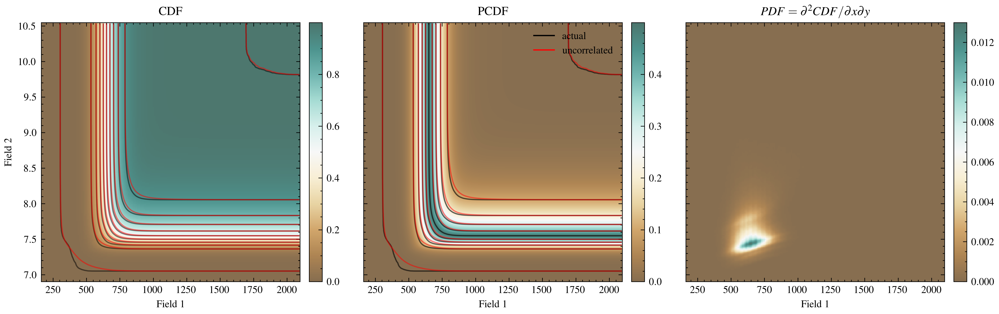

In [ ]:
plt.rcParams['image.cmap'] = 'BrBG'
cdf2 = plot_2d_cdf(rl[:,5], np.log10(vols[:,5]))

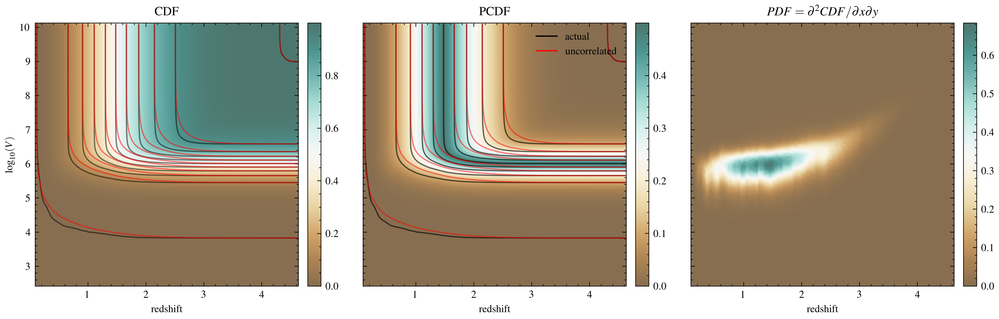

In [ ]:
cdf2 = plot_2d_cdf(rf["redshifts"][indices], np.log10(vols[:,1]),xlabel="redshift",ylabel=r"$\log_{10}(V)$")


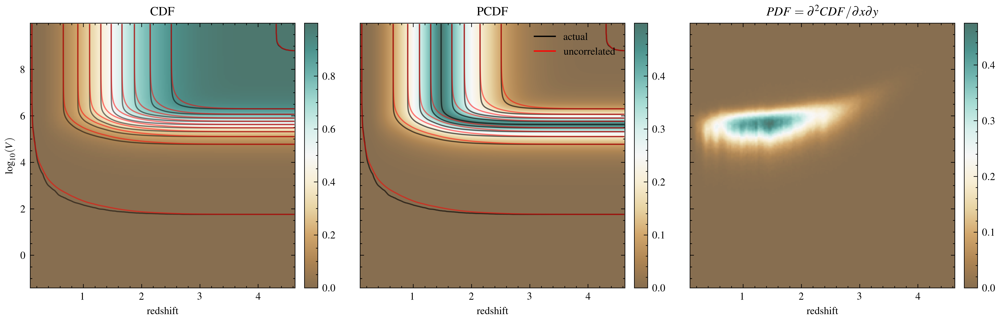

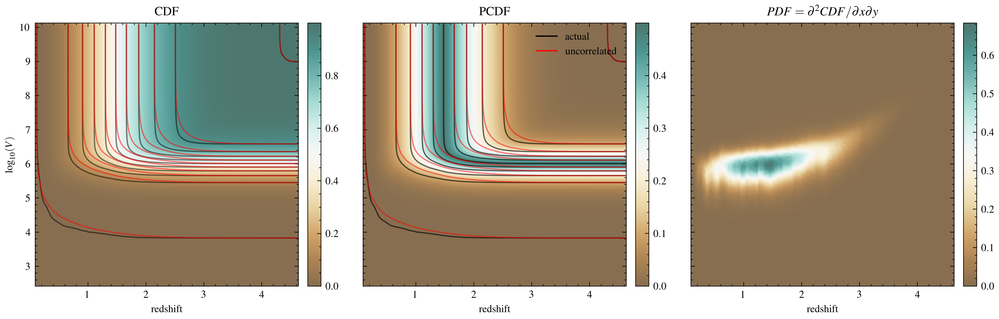

In [ ]:
cdf20 = plot_2d_cdf(rf["redshifts"][indices], np.log10(vols[:,0]),xlabel="redshift",ylabel=r"$\log_{10}(V)$")
cdf21 = plot_2d_cdf(rf["redshifts"][indices], np.log10(vols[:,1]),xlabel="redshift",ylabel=r"$\log_{10}(V)$")


In [ ]:
sez = SEdist.SE_distribution(rf["redshifts"])

(0.001, 1)

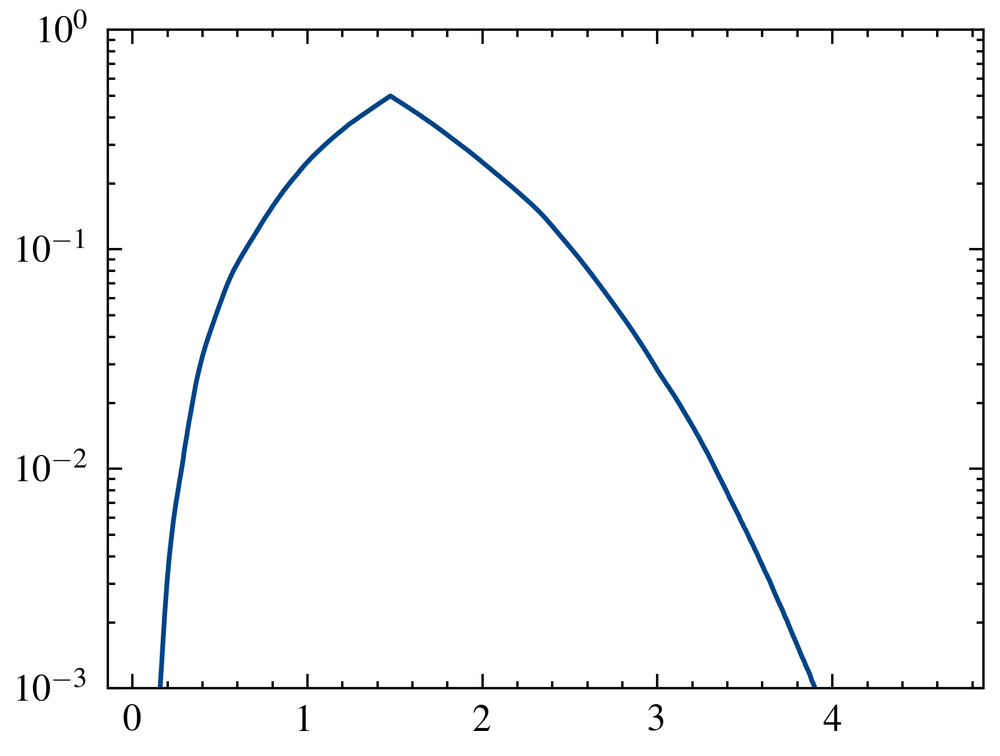

In [ ]:
plt.semilogy(sez.x(),sez.pcdf(sez.x()))
plt.ylim([1e-3,1])

In [ ]:
sez.ppf([0.005,0.995])

array([0.22382017, 3.51748985])